In [1]:
#import data manipulation packages 
import pandas as pd 
import numpy as np 
import os
import cv2
import matplotlib.pyplot as plt
import warnings

In [2]:
#import deep learning tools 
from tensorflow.keras.layers import Input, Lambda, Dense, Flatten, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.preprocessing import image, image_dataset_from_directory
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow import keras
import tensorflow as tf

In [3]:
tf.test.is_gpu_available()

Instructions for updating:
Use `tf.config.list_physical_devices('GPU')` instead.


False

In [4]:
# Set the seed value for experiment reproducibility.
seed = 1842
tf.random.set_seed(seed)
np.random.seed(seed)
# Turn off warnings for cleaner looking notebook
warnings.simplefilter('ignore')

In [5]:
#define image dataset 
#why do we rescale?
image_generator = ImageDataGenerator(rescale=1/255, validation_split=0.2) #shear_range =.25, zoom_range =.2, horizontal_flip = True, rotation_range=20)     

#Train & Validation Split 
train_dataset = image_generator.flow_from_directory(batch_size=32,
                                                 directory='data_cleaned/Train',
                                                 shuffle=True,
                                                 target_size=(224, 224), 
                                                 subset="training",
                                                 class_mode='categorical')

validation_dataset = image_generator.flow_from_directory(batch_size=32,
                                                 directory='data_cleaned/Train',
                                                 shuffle=True,
                                                 target_size=(224, 224), 
                                                 subset="validation",
                                                 class_mode='categorical')

#Organize data for our predictions 
image_generator_submission = ImageDataGenerator(rescale=1/255) 
submission = image_generator_submission.flow_from_directory(
                                                 directory='data_cleaned/scraped_images',
                                                 shuffle=False,
                                                 target_size=(224, 224), 
                                                 class_mode=None)

Found 430 images belonging to 2 classes.
Found 106 images belonging to 2 classes.
Found 100 images belonging to 1 classes.


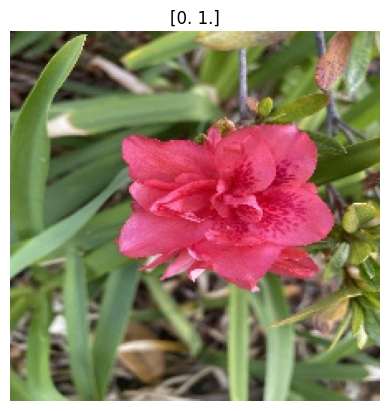

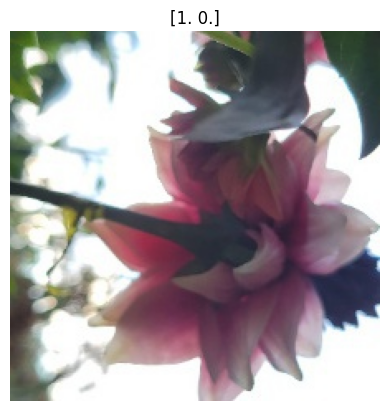

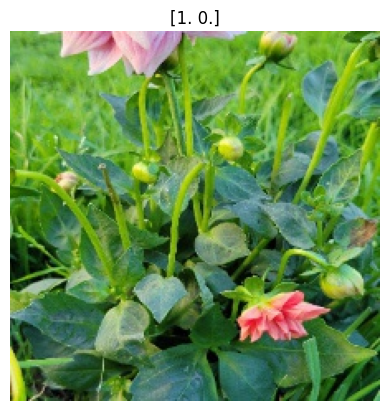

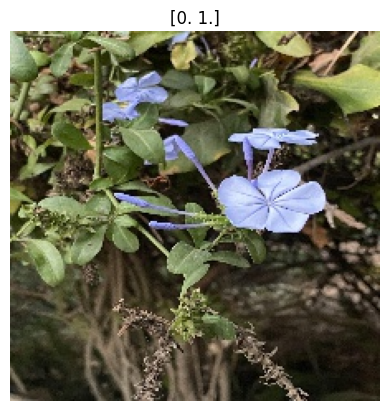

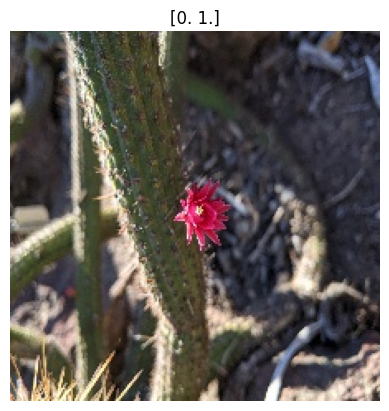

...

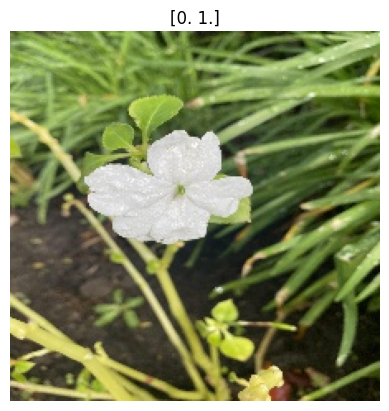

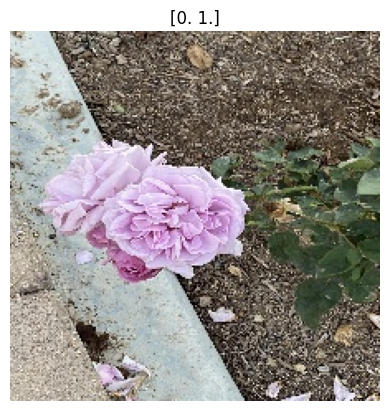

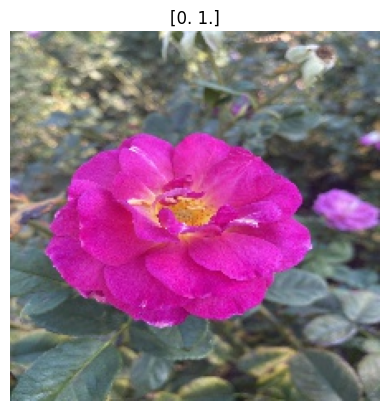

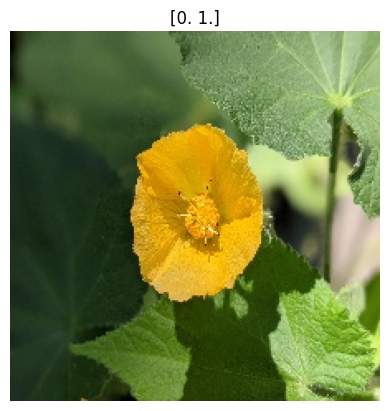

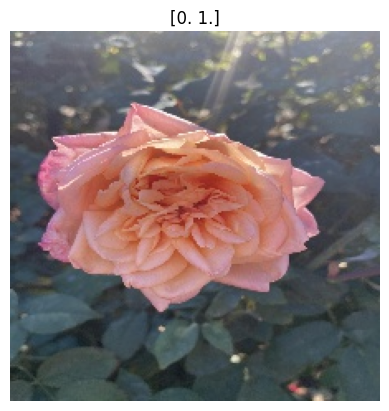

In [6]:
#show flowers for the first batch
batch_1_img = train_dataset[0]
for i in range(0,32):
    img = batch_1_img[0][i]
    lab = batch_1_img[1][i]
    plt.imshow(img)
    plt.title(lab)
    plt.axis('off')
    plt.show()

In [7]:
##Build out first classifier (CNN)

In [8]:
#experiment with Convolutional neural net
model = keras.models.Sequential([
    keras.layers.Conv2D(32, 3, activation='relu', input_shape = [224, 224,3]),
    keras.layers.MaxPooling2D(),
    keras.layers.Conv2D(32, 3, activation='relu'),
    keras.layers.MaxPooling2D(),
    keras.layers.Dropout(0.5),
    keras.layers.Flatten(),
    keras.layers.Dense(64, activation='relu'),
    keras.layers.Dense(2, activation ='softmax')])

In [9]:
model.compile(loss = 'binary_crossentropy',optimizer='adam', metrics = ['accuracy'])

callback = keras.callbacks.EarlyStopping(monitor='val_loss',
                                         patience=3,
                                         restore_best_weights=True)

In [10]:
model.fit(train_dataset, epochs=20, validation_data=validation_dataset, callbacks=callback)
#save model
#early stopping

Epoch 1/20
14/14 [==============================] - 28s 2s/step - loss: 0.9207 - accuracy: 0.5767 - val_loss: 0.6658 - val_accuracy: 0.7075
Epoch 2/20
14/14 [==============================] - 21s 1s/step - loss: 0.6069 - accuracy: 0.7047 - val_loss: 0.6157 - val_accuracy: 0.7075
Epoch 3/20
14/14 [==============================] - 20s 1s/step - loss: 0.5066 - accuracy: 0.7372 - val_loss: 0.5156 - val_accuracy: 0.8019
Epoch 4/20
14/14 [==============================] - 19s 1s/step - loss: 0.4258 - accuracy: 0.8395 - val_loss: 0.4827 - val_accuracy: 0.8396
Epoch 5/20
14/14 [==============================] - 21s 2s/step - loss: 0.3435 - accuracy: 0.8651 - val_loss: 0.6002 - val_accuracy: 0.7830
Epoch 6/20
14/14 [==============================] - 25s 2s/step - loss: 0.2539 - accuracy: 0.9256 - val_loss: 0.3284 - val_accuracy: 0.9057
Epoch 7/20
14/14 [==============================] - 24s 2s/step - loss: 0.1931 - accuracy: 0.9419 - val_loss: 0.3638 - val_accuracy: 0.8962
Epoch 8/20
14/14 [==

In [11]:
model.predict(submission)

4/4 [==============================] - 2s 478ms/step


array([[6.4400451e-06, 9.9999356e-01],
       [4.8463768e-05, 9.9995148e-01],
       [1.5466039e-04, 9.9984527e-01],
       [2.3964052e-08, 1.0000000e+00],
       [5.6506437e-06, 9.9999440e-01],
       [4.7547260e-06, 9.9999523e-01],
       [9.5045619e-02, 9.0495443e-01],
       [2.2368049e-06, 9.9999774e-01],
       [7.5380093e-08, 9.9999988e-01],
       [3.7154887e-04, 9.9962842e-01],
       [4.9320479e-05, 9.9995065e-01],
       [2.7149110e-06, 9.9999726e-01],
       [2.7154768e-02, 9.7284526e-01],
       [5.9871690e-09, 1.0000000e+00],
       [2.8584337e-02, 9.7141570e-01],
       [2.5390592e-01, 7.4609405e-01],
       [1.7888883e-06, 9.9999821e-01],
       [3.4094106e-02, 9.6590590e-01],
       [5.3942000e-07, 9.9999940e-01],
       [9.9999940e-01, 6.4486710e-07],
       [1.1590498e-03, 9.9884099e-01],
       [6.6037884e-08, 9.9999988e-01],
       [3.2788064e-02, 9.6721196e-01],
       [3.5854403e-06, 9.9999642e-01],
       [5.0211844e-09, 1.0000000e+00],
       [4.0149876e-06, 9.

In [12]:
loss, accuracy = model.evaluate(validation_dataset)
print("Loss:", loss)
print("Accuracy:", accuracy)

4/4 [==============================] - 1s 197ms/step - loss: 0.2757 - accuracy: 0.9057
Loss: 0.2756798267364502
Accuracy: 0.9056603908538818


In [13]:
len(train_dataset)

14

In [14]:
##Augment Dataset

In [15]:
data_augmentation = keras.Sequential([
    keras.layers.experimental.preprocessing.RandomFlip("horizontal", input_shape=(224,224,3)),
    keras.layers.experimental.preprocessing.RandomRotation(0.1),
    keras.layers.experimental.preprocessing.RandomZoom(0.1),
    keras.layers.experimental.preprocessing.RandomContrast(0.1),
])

In [16]:
model_a = Sequential([data_augmentation, model])

In [17]:
model_a.compile(loss = 'binary_crossentropy',optimizer='adam', metrics = ['accuracy'])

callback = keras.callbacks.EarlyStopping(monitor='val_loss',
                                         patience=3,
                                         restore_best_weights=True)

In [19]:
model_a.fit(train_dataset, epochs=20, validation_data=validation_dataset, callbacks=callback)

Epoch 1/20
14/14 [==============================] - 23s 2s/step - loss: 0.1962 - accuracy: 0.9163 - val_loss: 0.2359 - val_accuracy: 0.8962
Epoch 2/20
14/14 [==============================] - 20s 1s/step - loss: 0.1677 - accuracy: 0.9512 - val_loss: 0.3255 - val_accuracy: 0.8585
Epoch 3/20
14/14 [==============================] - 20s 1s/step - loss: 0.1462 - accuracy: 0.9581 - val_loss: 0.4615 - val_accuracy: 0.8679
Epoch 4/20
14/14 [==============================] - 21s 1s/step - loss: 0.1168 - accuracy: 0.9651 - val_loss: 0.7146 - val_accuracy: 0.8396


In [20]:
loss, accuracy = model_a.evaluate(validation_dataset)
print("Loss:", loss)
print("Accuracy:", accuracy)

4/4 [==============================] - 1s 212ms/step - loss: 0.2359 - accuracy: 0.8962
Loss: 0.23587533831596375
Accuracy: 0.8962264060974121


In [ ]:
##Parameter tuning

In [21]:
final_data = []
final_labels = []

for i in range(0,len(train_dataset)):
    batch = train_dataset[i]
    for j in range(len(batch[0])):
        final_data.append(batch[0][j])
        final_labels.append(batch[1][j])

val_data = []
val_labels = []

for i in range(0,len(validation_dataset)):
    batch = validation_dataset[i]
    for j in range(len(batch[0])):
        val_data.append(batch[0][j])
        val_labels.append(batch[1][j])
        

        
final_data = np.array(final_data)
final_labels = np.array(final_labels)
val_data = np.array(val_data)
val_labels = np.array(val_labels)

In [22]:
from kerastuner.tuners import RandomSearch

def build_model(hp):
    model = keras.Sequential([data_augmentation])
    model.add(keras.layers.AveragePooling2D(4,2))
    
    for i in range(hp.Int("Conv Layers", min_value=0, max_value=3)):
        model.add(keras.layers.Conv2D(hp.Choice(f"layer_{i}_filters", [16,32,64]), 3, activation='relu'))
        model.add(keras.layers.MaxPool2D((3,3)))

    #model.add(keras.layers.MaxPool2D())
    model.add(keras.layers.Dropout(0.5))
    model.add(keras.layers.Flatten())

    model.add(keras.layers.Dense(hp.Choice("Dense layer", [64, 128, 256]), activation='relu'))

    model.add(keras.layers.Dense(2, activation='softmax'))

    model.compile(optimizer='adam',
              loss='binary_crossentropy',
              metrics=['accuracy'])

    return model

tuner = RandomSearch(
    build_model,
    objective='val_loss',
    max_trials=32,
)

tuner.search(final_data, final_labels, validation_data=(val_data, val_labels), epochs=20)


Reloading Tuner from .\untitled_project\tuner0.json


In [23]:
best_model = tuner.get_best_models()[0]

In [24]:
best_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential_1 (Sequential)   (None, 224, 224, 3)       0         
                                                                 
 average_pooling2d (Average  (None, 111, 111, 3)       0         
 Pooling2D)                                                      
                                                                 
 conv2d (Conv2D)             (None, 109, 109, 64)      1792      
                                                                 
 max_pooling2d (MaxPooling2  (None, 36, 36, 64)        0         
 D)                                                              
                                                                 
 dropout (Dropout)           (None, 36, 36, 64)        0         
                                                                 
 flatten (Flatten)           (None, 82944)             0

In [25]:
loss, accuracy = best_model.evaluate(validation_dataset)

print("LOSS", loss)
print("ACCURACY", accuracy)

4/4 [==============================] - 1s 136ms/step - loss: 0.0952 - accuracy: 0.9811
LOSS 0.0951867401599884
ACCURACY 0.9811320900917053


In [ ]:
##CREATE SUBMISSION

In [26]:
onlyfiles = [f.split('.')[0] for f in os.listdir(os.path.join('data_cleaned/scraped_images/image_files')) if os.path.isfile(os.path.join(os.path.join('data_cleaned/scraped_images/image_files'), f))]
submission_df = pd.DataFrame(onlyfiles, columns =['images'])
submission_df[['la_eterna','other_flower']] = best_model.predict(submission)
submission_df.head()

4/4 [==============================] - 2s 370ms/step


,images,la_eterna,other_flower
0,img_00,0.000127,0.999873
1,img_01,0.000007,0.999993
2,img_02,0.000017,0.999983
3,img_03,0.000020,0.999980
4,img_04,0.000357,0.999643


In [27]:
submission_df.to_csv('submission_file.csv', index = False)